About dataset:
This open dataset is taken from Kaggle.
Link: https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata

In [25]:
import pandas as pd #import necessary libraries
import numpy as np
import datetime as dt 
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from ydata_profiling import ProfileReport
from tqdm import tqdm
import random

In [26]:
url = 'https://drive.google.com/file/d/1DJREFDMpI7uCGELB-TIZvu8WPVwo6ucW/view?usp=sharing'
url = 'https://drive.google.com/uc?id=' + url.split('/')[-2]
table = pd.read_csv(url) #import the dataset

C:\Users\Slava\AppData\Local\Temp\ipykernel_4456\1514221295.py:3: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  table = pd.read_csv(url) #import the dataset


[En] Data cleaning and EDA

In [27]:
table.shape

(102599, 26)

In [28]:
table.columns

Index(['id', 'NAME', 'host id', 'host_identity_verified', 'host name',
       'neighbourhood group', 'neighbourhood', 'lat', 'long', 'country',
       'country code', 'instant_bookable', 'cancellation_policy', 'room type',
       'Construction year', 'price', 'service fee', 'minimum nights',
       'number of reviews', 'last review', 'reviews per month',
       'review rate number', 'calculated host listings count',
       'availability 365', 'house_rules', 'license'],
      dtype='object')

In [29]:
table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   NAME                            102349 non-null  object 
 2   host id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host name                       102193 non-null  object 
 5   neighbourhood group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [30]:
table.columns = table.columns.str.lower().str.replace(' ', '_') # lead columns names to one size and without spaces

In [31]:
table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102599 entries, 0 to 102598
Data columns (total 26 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   id                              102599 non-null  int64  
 1   name                            102349 non-null  object 
 2   host_id                         102599 non-null  int64  
 3   host_identity_verified          102310 non-null  object 
 4   host_name                       102193 non-null  object 
 5   neighbourhood_group             102570 non-null  object 
 6   neighbourhood                   102583 non-null  object 
 7   lat                             102591 non-null  float64
 8   long                            102591 non-null  float64
 9   country                         102067 non-null  object 
 10  country_code                    102468 non-null  object 
 11  instant_bookable                102494 non-null  object 
 12  cancellation_pol

In [32]:
table.describe()

,id,host_id,lat,long,construction_year,minimum_nights,number_of_reviews,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365
count,1.025990e+05,1.025990e+05,102591.000000,102591.000000,102385.000000,102190.000000,102416.000000,86720.000000,102273.000000,102280.000000,102151.000000
mean,2.914623e+07,4.925411e+10,40.728094,-73.949644,2012.487464,8.135845,27.483743,1.374022,3.279106,7.936605,141.133254
std,1.625751e+07,2.853900e+10,0.055857,0.049521,5.765556,30.553781,49.508954,1.746621,1.284657,32.218780,135.435024
min,1.001254e+06,1.236005e+08,40.499790,-74.249840,2003.000000,-1223.000000,0.000000,0.010000,1.000000,1.000000,-10.000000
25%,1.508581e+07,2.458333e+10,40.688740,-73.982580,2007.000000,2.000000,1.000000,0.220000,2.000000,1.000000,3.000000
50%,2.913660e+07,4.911774e+10,40.722290,-73.954440,2012.000000,3.000000,7.000000,0.740000,3.000000,1.000000,96.000000
75%,4.320120e+07,7.399650e+10,40.762760,-73.932350,2017.000000,5.000000,30.000000,2.000000,4.000000,2.000000,269.000000
max,5.736742e+07,9.876313e+10,40.916970,-73.705220,2022.000000,5645.000000,1024.000000,90.000000,5.000000,332.000000,3677.000000


In [33]:
table.dtypes 

id                                  int64
name                               object
host_id                             int64
host_identity_verified             object
host_name                          object
neighbourhood_group                object
neighbourhood                      object
lat                               float64
long                              float64
country                            object
country_code                       object
instant_bookable                   object
cancellation_policy                object
room_type                          object
construction_year                 float64
price                              object
service_fee                        object
minimum_nights                    float64
number_of_reviews                 float64
last_review                        object
reviews_per_month                 float64
review_rate_number                float64
calculated_host_listings_count    float64
availability_365                  

In [34]:
table.duplicated().sum() # look at number of duplicates in the dataset

541

In [35]:
table.drop_duplicates(inplace=True) # drop duplicates

In [36]:
table.duplicated().sum() # check number of duplicates in the dataset

0

In [37]:
table.host_identity_verified.isna().sum() 

289

In [38]:
table.host_identity_verified.value_counts() # look at the values in host identity verified column

unconfirmed    50944
verified       50825
Name: host_identity_verified, dtype: int64

In [39]:
table.host_identity_verified.fillna('unconfirmed', inplace=True) 
# replace NaN values replace by unconfirmed, because we can't check why this datset includes NaN values

In [40]:
table.host_identity_verified.isna().sum()

0

In [41]:
table.neighbourhood_group.value_counts() # look at the values in neighbourhood group column

Manhattan        43557
Brooklyn         41630
Queens           13197
Bronx             2694
Staten Island      949
brookln              1
manhatan             1
Name: neighbourhood_group, dtype: int64

In [42]:
table.neighbourhood_group = table.neighbourhood_group.map(lambda x: 'Manhattan' if x=='manhatan' else ('Brooklyn' if x=='brookln' else x)) 
# replace the incorrecty entered values by the correct name of neighbourhood group

In [43]:
table.neighbourhood_group.value_counts() # checking

Manhattan        43558
Brooklyn         41631
Queens           13197
Bronx             2694
Staten Island      949
Name: neighbourhood_group, dtype: int64

In [44]:
table.neighbourhood_group.isna().sum() # check NaN values in the column

29

In [45]:
missing_group = table[table.neighbourhood_group.isna()].groupby('neighbourhood', as_index=False).count()['neighbourhood']
missing_group # create table with values in neighbourhood column to find the missing values in the neighbourhood group

0     Bedford-Stuyvesant
1               Bushwick
2                Chelsea
3              Chinatown
4           Clinton Hill
5            East Harlem
6           East Village
7            Eastchester
8                 Harlem
9       Prospect Heights
10        Queens Village
11       Upper East Side
12       Upper West Side
13    Washington Heights
14          Williamsburg
15              Woodside
Name: neighbourhood, dtype: object

In [46]:
neighbourhood_group_by_known_neighbourhood = table[table.neighbourhood.isin(missing_group)].groupby('neighbourhood', as_index=False)['neighbourhood_group'].value_counts().copy()
neighbourhood_group_by_known_neighbourhood 
# create table with pair of the known values in the dataset: neighbourhood - neighbourhood group

,neighbourhood,neighbourhood_group,count
0,Bedford-Stuyvesant,Brooklyn,7897
1,Bushwick,Brooklyn,4953
2,Chelsea,Manhattan,2275
3,Chinatown,Manhattan,788
4,Clinton Hill,Brooklyn,1133
5,East Harlem,Manhattan,2320
6,East Village,Manhattan,3474
7,Eastchester,Bronx,28
8,Harlem,Manhattan,5438
9,Prospect Heights,Brooklyn,694


In [47]:
result_table = pd.merge(table.loc[table.neighbourhood_group.isna(),['neighbourhood_group','neighbourhood' ]],
                                                                                                neighbourhood_group_by_known_neighbourhood,
                                                                                                  on='neighbourhood',
                                                                                                    how='left')\
                                                                                                      .copy()\
                                                                                                        .drop(columns=['neighbourhood_group_x','count'])\
                                                                                                        .rename(columns={'neighbourhood_group_y':'neighbourhood_group'})\
                                                                                                        .reindex(columns=['neighbourhood_group','neighbourhood'])
result_table.set_index('neighbourhood', drop=True, inplace=True)
result_table
# create table with pair of the known values in the dataset: neighbourhood - neighbourhood group

,neighbourhood_group
neighbourhood,
Washington Heights,Manhattan
Clinton Hill,Brooklyn
East Village,Manhattan
Upper East Side,Manhattan
Woodside,Queens
Williamsburg,Brooklyn
Bushwick,Brooklyn
Prospect Heights,Brooklyn
East Village,Manhattan


In [48]:
table.loc[table.neighbourhood_group.isna(),'neighbourhood_group'] = table.loc[table.neighbourhood_group.isna(),['neighbourhood_group','neighbourhood']]\
    .apply(lambda x: result_table.loc[result_table.index == x['neighbourhood']]['neighbourhood_group'][0] , axis = 1 )
# fill NaN values by the received neighbourhood group values

In [49]:
table.groupby('neighbourhood_group').neighbourhood.count() # check value counts in the column

neighbourhood_group
Bronx             2695
Brooklyn         41636
Manhattan        43563
Queens           13199
Staten Island      949
Name: neighbourhood, dtype: int64

In [50]:
table.iloc[90] # check randomed row in the dataset which had missing value in the neighbourhood_group column before filling

id                                                                          1051043
name                                              Cozy Bedroom in Williamsburg 3 BR
host_id                                                                 14067827221
host_identity_verified                                                  unconfirmed
host_name                                                                  Lilianna
neighbourhood_group                                                        Brooklyn
neighbourhood                                                          Williamsburg
lat                                                                        40.71156
long                                                                      -73.96218
country                                                               United States
country_code                                                                     US
instant_bookable                                                            

In [51]:
table.neighbourhood_group.isna().sum()

0

In [52]:
table[table.neighbourhood.isna()].groupby('neighbourhood_group', as_index=False)['id'].count()

,neighbourhood_group,id
0,Brooklyn,8
1,Manhattan,8


In [53]:
Manhattan_nan = table.query('neighbourhood_group=="Manhattan"')\
    .groupby('neighbourhood_group',as_index=False)\
        .neighbourhood.value_counts()['neighbourhood'][0]

Brooklyn_nan = table.query('neighbourhood_group=="Brooklyn"')\
    .groupby('neighbourhood_group',as_index=False)\
        .neighbourhood.value_counts()['neighbourhood'][0]

# create the variables which contain the most occured value in column  (mode) filtered by neighbourhood group

In [54]:
table.loc[(table['neighbourhood_group']=='Manhattan') & (table.neighbourhood.isna()), 'neighbourhood'] = table.loc[(table['neighbourhood_group']=='Manhattan') & (table.neighbourhood.isna()), 'neighbourhood']\
    .fillna(Manhattan_nan)
# fill NaN values by mode in the neighbourhood column

In [55]:
table.loc[(table['neighbourhood_group']=='Brooklyn') & (table.neighbourhood.isna()), 'neighbourhood']= table.loc[(table['neighbourhood_group']=='Brooklyn') & (table.neighbourhood.isna()), 'neighbourhood']\
    .fillna(Brooklyn_nan)
# fill NaN values by mode in the neighbourhood column

In [56]:
table[table['lat'].isna()|table['long'].isna()] 
# check NaN values in the lat and long columns
# we see that missing values in different columns are crossed and they are in the same rows 

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
779,1431578,"Large, furnished room in a 2 bedroom!",20368956893,unconfirmed,Gibson,Brooklyn,Crown Heights,NaN,NaN,United States,...,$108,1.0,1.0,3/18/2017,0.04,2.0,1.0,41.0,- Weekly and monthly prices are much lower - P...,NaN
785,1434892,Authentic NY Charming Artist Loft,66486085219,unconfirmed,Bailey,Brooklyn,Greenpoint,NaN,NaN,United States,...,$212,5.0,14.0,6/19/2019,0.16,5.0,1.0,226.0,We live and let live - hoping that you'd be re...,NaN
799,1442624,Huge room with private balcony,69386945815,verified,Hunt,Manhattan,East Village,NaN,NaN,United States,...,$101,6.0,1.0,5/6/2013,0.01,1.0,1.0,240.0,Expect respect for the family and the space--t...,NaN
814,1450908,Decorators 5-Star Flat West Village,33280739304,verified,Watson,Manhattan,West Village,NaN,NaN,United States,...,$76,20.0,157.0,8/11/2016,1.71,4.0,1.0,61.0,"Please keep it clean, thats all we really ask ...",NaN
843,1466925,Nice Private Room Beauty in Queens,15305733205,verified,Roberts,Queens,Elmhurst,NaN,NaN,United States,...,$45,1.0,63.0,5/18/2019,0.89,3.0,2.0,70.0,NaN,NaN
885,1490122,Cute Room in Historic Loft!,42267829819,unconfirmed,Jones,Brooklyn,Greenpoint,NaN,NaN,United States,...,$105,14.0,22.0,5/2/2019,0.25,1.0,1.0,266.0,"Pets are cool (just clean up after them!), smo...",NaN
926,1512766,21 day Chelsea Apartment rental,10876728736,unconfirmed,Owens,Manhattan,Flatiron District,NaN,NaN,United States,...,$125,21.0,0.0,NaN,NaN,2.0,1.0,104.0,NaN,NaN
986,1545904,New York City for All Seasons!,26437872336,unconfirmed,Douglas,Manhattan,Upper West Side,NaN,NaN,United States,...,$83,1.0,25.0,6/22/2013,0.28,2.0,1.0,259.0,No Smoking No Pets,NaN


In [57]:
table[table['lat'].isna()|table['long'].isna()]['neighbourhood'].values
# getting the neighbourhood values from rows with the missing values in the lat and long columns

array(['Crown Heights', 'Greenpoint', 'East Village', 'West Village',
       'Elmhurst', 'Greenpoint', 'Flatiron District', 'Upper West Side'],
      dtype=object)

In [58]:
lat_long_missing_median = table[table.neighbourhood.isin(['Crown Heights', 'Greenpoint', 'East Village', 'West Village',
       'Elmhurst', 'Greenpoint', 'Flatiron District', 'Upper West Side'])].groupby('neighbourhood', as_index=False)\
        .agg({'lat':'median','long':'median'}).copy()
lat_long_missing_median
# create the table with the neighbourhood values and the median values of the lat and long columns which are matched with the neighbourhood values

,neighbourhood,lat,long
0,Crown Heights,40.673020,-73.948260
1,East Village,40.726840,-73.983900
2,Elmhurst,40.740415,-73.877685
3,Flatiron District,40.741060,-73.988000
4,Greenpoint,40.727150,-73.952145
5,Upper West Side,40.789310,-73.973145
6,West Village,40.734180,-74.003900


In [59]:
table.loc[(table['lat'].isna()|table['long'].isna()),'lat'] = table.loc[(table['lat'].isna()|table['long'].isna()),['lat', 'neighbourhood']]\
    .apply(lambda x: lat_long_missing_median.loc[lat_long_missing_median['neighbourhood']==x['neighbourhood']]['lat'].values[0], axis=1)
# fill NaN values in the lat column

In [60]:
table.loc[(table['lat'].isna()|table['long'].isna()),'long'] = table.loc[(table['lat'].isna()|table['long'].isna()),['long', 'neighbourhood']]\
    .apply(lambda x: lat_long_missing_median.loc[lat_long_missing_median['neighbourhood']==x['neighbourhood']]['long'].values[0], axis=1)
# fill NaN values in the long column


In [61]:
table.isna().sum()
# check the missing values in the dataset

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price                                247
service_fee                          273
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [62]:
table.iloc[785]
# check randomed row in the dataset which had missing value in the lat and long columns before filling

id                                                                          1434892
name                                              Authentic NY Charming Artist Loft
host_id                                                                 66486085219
host_identity_verified                                                  unconfirmed
host_name                                                                    Bailey
neighbourhood_group                                                        Brooklyn
neighbourhood                                                            Greenpoint
lat                                                                        40.72715
long                                                                     -73.952145
country                                                               United States
country_code                                                                     US
instant_bookable                                                            

In [63]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price                                247
service_fee                          273
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [64]:
table.price # look at the data in the price column

0           $966 
1           $142 
2           $620 
3           $368 
4           $204 
           ...   
102053      $696 
102054      $909 
102055      $387 
102056      $848 
102057    $1,128 
Name: price, Length: 102058, dtype: object

In [65]:
table.price = table.price.str.replace('$','')
table.price = table.price.str.replace(',','')

# replace the interfering symbols from the values in the column

C:\Users\Slava\AppData\Local\Temp\ipykernel_4456\4054274584.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  table.price = table.price.str.replace('$','')


In [66]:
table.rename(columns={'price':'price_usd'}, inplace=True)
# change the name of the column

In [67]:
table.price_usd = table.price_usd.astype(float)
# transform the type of the column

In [68]:
table.price_usd 
# look at the data in the price column after transforming

0          966.0
1          142.0
2          620.0
3          368.0
4          204.0
           ...  
102053     696.0
102054     909.0
102055     387.0
102056     848.0
102057    1128.0
Name: price_usd, Length: 102058, dtype: float64

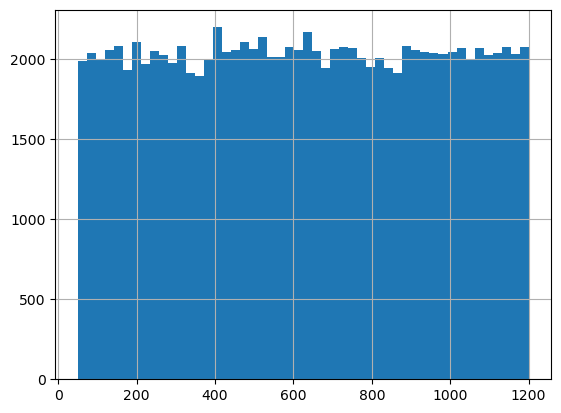

In [69]:
table.price_usd.hist(bins=50) # look at the price distribution
plt.show()

In [70]:
table.service_fee = table.service_fee.str.replace('$','')
# replace the interfering symbols from the values in the column

C:\Users\Slava\AppData\Local\Temp\ipykernel_4456\3674804619.py:1: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  table.service_fee = table.service_fee.str.replace('$','')


In [71]:
table.service_fee = table.service_fee.astype('float')
# transform the type of the column

In [72]:
service_fee_calculating = table.loc[-table.price_usd.isna(),['neighbourhood_group', 'neighbourhood', 'price_usd','service_fee' ]]\
    .copy()
# let's find the ratio between price and service fee. Create table for the checking this ratio

In [73]:
service_fee_calculating['ratio'] = round(service_fee_calculating.price_usd/service_fee_calculating.service_fee,0)
service_fee_calculating
# calculate the ration between price and service fee


,neighbourhood_group,neighbourhood,price_usd,service_fee,ratio
0,Brooklyn,Kensington,966.0,193.0,5.0
1,Manhattan,Midtown,142.0,28.0,5.0
2,Manhattan,Harlem,620.0,124.0,5.0
3,Brooklyn,Clinton Hill,368.0,74.0,5.0
4,Manhattan,East Harlem,204.0,41.0,5.0
...,...,...,...,...,...
102053,Brooklyn,Flatbush,696.0,NaN,NaN
102054,Brooklyn,Bushwick,909.0,NaN,NaN
102055,Brooklyn,Bedford-Stuyvesant,387.0,NaN,NaN
102056,Manhattan,Harlem,848.0,NaN,NaN


In [74]:
service_fee_calculating.ratio.value_counts()
# we see, that the service fee is the one fifth of the price (20%)

5.0    101572
Name: ratio, dtype: int64

In [75]:
len(table[table.price_usd.isna()&-table.service_fee.isna()])
# check the number of missing values

213

In [76]:
table.loc[((table.price_usd.isna())&(-table.service_fee.isna())), 'price_usd'] = table.loc[((table.price_usd.isna())&(-table.service_fee.isna()))]\
    .apply(lambda x: round(x['service_fee']*5.0,0), axis=1)
# fill the missing price by multiply the service fee by 5

In [77]:
service_fee_calculating = table.loc[-table.price_usd.isna(),['neighbourhood_group', 'neighbourhood', 'price_usd','service_fee' ]]\
    .copy() 
# checking again

In [78]:
service_fee_calculating['ratio'] = round(service_fee_calculating.price_usd/service_fee_calculating.service_fee,0)
service_fee_calculating

,neighbourhood_group,neighbourhood,price_usd,service_fee,ratio
0,Brooklyn,Kensington,966.0,193.0,5.0
1,Manhattan,Midtown,142.0,28.0,5.0
2,Manhattan,Harlem,620.0,124.0,5.0
3,Brooklyn,Clinton Hill,368.0,74.0,5.0
4,Manhattan,East Harlem,204.0,41.0,5.0
...,...,...,...,...,...
102053,Brooklyn,Flatbush,696.0,NaN,NaN
102054,Brooklyn,Bushwick,909.0,NaN,NaN
102055,Brooklyn,Bedford-Stuyvesant,387.0,NaN,NaN
102056,Manhattan,Harlem,848.0,NaN,NaN


In [79]:
service_fee_calculating.ratio.value_counts()

5.0    101785
Name: ratio, dtype: int64

In [80]:
len(table[table.price_usd.isna()&-table.service_fee.isna()])
# checking again

0

In [81]:
len(table.loc[((table.price_usd.isna())&(table.service_fee.isna()))])
# check the number of the values where there are missing values in the columns price and service fee 

34

In [82]:
round(table.price_usd.mean(),0) # calculate the price mean

625.0

In [83]:
round(table.price_usd.median(),0) # calculate the price median

624.0

<AxesSubplot:>

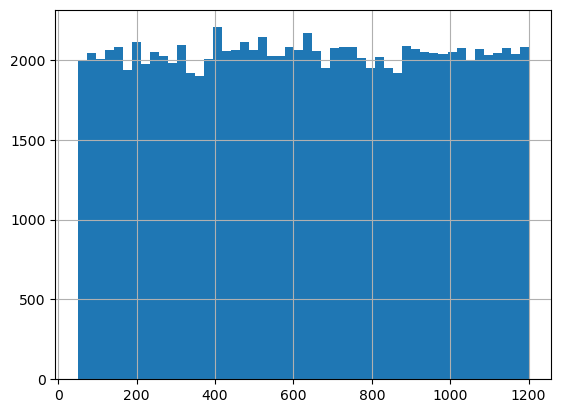

In [84]:
table.price_usd.hist(bins=50)

In [85]:
price_medians = table.groupby(['neighbourhood_group', 'neighbourhood'], as_index=False).agg({'price_usd':'median'}).copy()
price_medians
# create the table with the median price grouped by the neighbourhood group and neighbourhood

,neighbourhood_group,neighbourhood,price_usd
0,Bronx,Allerton,601.5
1,Bronx,Baychester,387.0
2,Bronx,Belmont,682.0
3,Bronx,Bronxdale,613.0
4,Bronx,Castle Hill,414.5
...,...,...,...
219,Staten Island,Tottenville,668.0
220,Staten Island,West Brighton,627.0
221,Staten Island,Westerleigh,524.0
222,Staten Island,Willowbrook,594.0


In [86]:
table.loc[table.price_usd.isna(),'price_usd'] = table.loc[table['price_usd'].isna(),['neighbourhood_group','neighbourhood','price_usd']]\
    .apply(lambda x: price_medians\
        .loc[(price_medians['neighbourhood_group']==x['neighbourhood_group'])&(price_medians['neighbourhood']==x['neighbourhood'])]['price_usd'].values[0]
    ,axis=1)
# fill the NaN price values by the groped median values from price_medians table in the price column 

In [87]:
table.isna().sum() # check data

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price_usd                              0
service_fee                          273
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [88]:
table.loc[table.service_fee.isna(),'service_fee'] = table.loc[table.service_fee.isna(),['price_usd','service_fee']].apply(lambda x: round(x['price_usd']/5,0), axis=1)
# fill the NaN service fee values by the price devided by 5 

In [89]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                     105
cancellation_policy                   76
room_type                              0
construction_year                    214
price_usd                              0
service_fee                            0
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [90]:
table.instant_bookable.value_counts()
# look at the values 

False    51186
True     50767
Name: instant_bookable, dtype: int64

In [91]:
table.instant_bookable.fillna(False, inplace=True)
# fill the NaN values by the most occured value

In [92]:
table.instant_bookable = table.instant_bookable.astype(bool)
# transform the type of data

In [93]:
table.instant_bookable.value_counts()

False    51291
True     50767
Name: instant_bookable, dtype: int64

In [94]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                   76
room_type                              0
construction_year                    214
price_usd                              0
service_fee                            0
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [95]:
table.cancellation_policy.value_counts()
# look at the values 

moderate    34162
strict      33929
flexible    33891
Name: cancellation_policy, dtype: int64

In [96]:
table.cancellation_policy.fillna('moderate',inplace=True)     
# fill the NaN values by a 'moderate' value because it's the most occurred value and between 'strict' and 'flexible' according to cancellation policy

In [97]:
table.cancellation_policy.value_counts()
# checking after changing

moderate    34238
strict      33929
flexible    33891
Name: cancellation_policy, dtype: int64

In [98]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                    214
price_usd                              0
service_fee                            0
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [99]:
table.construction_year.value_counts()
# checking the values in the column

2014.0    5220
2008.0    5192
2006.0    5191
2019.0    5174
2009.0    5140
2020.0    5135
2010.0    5128
2022.0    5113
2003.0    5103
2012.0    5101
2005.0    5099
2007.0    5086
2015.0    5070
2017.0    5038
2011.0    5027
2018.0    5024
2004.0    5009
2021.0    5009
2013.0    4995
2016.0    4990
Name: construction_year, dtype: int64

In [100]:
table.construction_year.fillna('not availiable', inplace=True)
# we can't define the value of the constraction year, so fill the NaN values by 'not availiable' value

In [101]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                       400
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [102]:
table.minimum_nights.sort_values(ascending=True)

42446   -1223.0
42500    -365.0
42538    -200.0
69749    -125.0
441       -12.0
          ...  
98319       NaN
98320       NaN
98321       NaN
98322       NaN
98323       NaN
Name: minimum_nights, Length: 102058, dtype: float64

In [103]:
table.minimum_nights.value_counts()

 1.0      25290
 2.0      23495
 3.0      16038
 30.0     11554
 4.0       6606
          ...  
-3.0          1
 273.0        1
 175.0        1
 98.0         1
 825.0        1
Name: minimum_nights, Length: 153, dtype: int64

In [104]:
table.minimum_nights = abs(table.minimum_nights)
# cannot be negative values, so change negative to positive

In [105]:
table.minimum_nights.sort_values(ascending=True)

51115    1.0
48584    1.0
21839    1.0
91476    1.0
48585    1.0
        ... 
98319    NaN
98320    NaN
98321    NaN
98322    NaN
98323    NaN
Name: minimum_nights, Length: 102058, dtype: float64

In [106]:
table.minimum_nights.mode()[0]

1.0

In [107]:
table.minimum_nights.fillna(table.minimum_nights.mode()[0],inplace=True)
# fill the NaN values by the most occurred value

In [108]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                    183
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [109]:
table.number_of_reviews.sort_values(ascending=True)    

11297     0.0
13812     0.0
76837     0.0
38041     0.0
13805     0.0
         ... 
91027     NaN
91831     NaN
99736     NaN
100590    NaN
101292    NaN
Name: number_of_reviews, Length: 102058, dtype: float64

In [110]:
table.number_of_reviews.sort_values(ascending=False)    

52488     1024.0
62244     1010.0
49799      966.0
53078      884.0
49653      849.0
           ...  
91027        NaN
91831        NaN
99736        NaN
100590       NaN
101292       NaN
Name: number_of_reviews, Length: 102058, dtype: float64

In [111]:
table.number_of_reviews.value_counts()

0.0      15673
1.0      10348
2.0       7129
3.0       5341
4.0       4125
         ...  
567.0        1
592.0        1
797.0        1
966.0        1
300.0        1
Name: number_of_reviews, Length: 476, dtype: int64

In [112]:
missing_number_reviews_by_pm = table.groupby(['reviews_per_month'], as_index=False)['number_of_reviews'].median().copy()
missing_number_reviews_by_pm
# create the table with the median groped by reviews per month of the number of reviews

,reviews_per_month,number_of_reviews
0,0.01,1.0
1,0.02,1.0
2,0.03,1.0
3,0.04,1.0
4,0.05,1.0
...,...,...
1011,57.31,1024.0
1012,58.50,156.0
1013,65.74,618.0
1014,84.49,797.0


In [113]:
table.loc[(table.number_of_reviews.isna() & -table.reviews_per_month.isna()), 'number_of_reviews'] = table.\
    loc[(table.number_of_reviews.isna() & -table.reviews_per_month.isna()), ['number_of_reviews','reviews_per_month']]\
        .apply(lambda x: missing_number_reviews_by_pm.loc[missing_number_reviews_by_pm['reviews_per_month']== x['reviews_per_month'], 'number_of_reviews'].values[0]
        ,axis=1)
# fill the Nan values by the median from table 'missing_number_reviews_by_pm'

In [114]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                    123
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [115]:
missing_number_reviews_by_rr_pm = table.groupby(['review_rate_number'], as_index=False)['number_of_reviews'].median().copy()
missing_number_reviews_by_rr_pm
# create the table with the median groped by review rate of the number of reviews

,review_rate_number,number_of_reviews
0,1.0,9.0
1,2.0,7.0
2,3.0,7.0
3,4.0,7.0
4,5.0,7.0


In [116]:
table.loc[(table.number_of_reviews.isna() & -table.review_rate_number.isna()), 'number_of_reviews'] = table.\
    loc[(table.number_of_reviews.isna() & -table.review_rate_number.isna()), ['number_of_reviews', 'review_rate_number']]\
        .apply(lambda x: missing_number_reviews_by_rr_pm.loc[missing_number_reviews_by_rr_pm['review_rate_number']== x['review_rate_number']
        , 'number_of_reviews'].values[0]
        ,axis=1)
# fill the Nan values by the median from table 'missing_number_reviews_by_rr_pm'

In [117]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                      0
last_review                        15832
reviews_per_month                  15818
review_rate_number                   319
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [118]:
table.review_rate_number.value_counts()      

5.0    23251
4.0    23200
3.0    23130
2.0    22972
1.0     9186
Name: review_rate_number, dtype: int64

In [119]:
table.groupby(['number_of_reviews', 'reviews_per_month'], as_index=False)['review_rate_number'].median()
# we see that there a lot different conflicting combinations 

,number_of_reviews,reviews_per_month,review_rate_number
0,1.0,0.01,3.0
1,1.0,0.02,3.0
2,1.0,0.03,3.0
3,1.0,0.04,3.0
4,1.0,0.05,3.0
...,...,...,...
20796,849.0,90.00,4.0
20797,884.0,25.23,3.0
20798,966.0,34.46,2.0
20799,1010.0,33.08,4.0


In [120]:
table.loc[(-table.number_of_reviews.isna() & table.review_rate_number.isna()), 'review_rate_number'] = table.loc[(-table.number_of_reviews.isna() & table.review_rate_number.isna()), 'review_rate_number']\
    .map(lambda x: random.choices([1.0,2.0,3.0,4.0,5.0], weights=[9186, 22972, 23130, 23200, 23251]))
# fill the NaN values by random review rate according to value's weights

In [121]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                      0
last_review                        15832
reviews_per_month                  15818
review_rate_number                     0
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [122]:
table.last_review
   

0         10/19/2021
1          5/21/2022
2                NaN
3           7/5/2019
4         11/19/2018
             ...    
102053     3/27/2019
102054     8/31/2017
102055     6/26/2019
102056           NaN
102057     6/15/2019
Name: last_review, Length: 102058, dtype: object

In [123]:
table.loc[(table.last_review.isna() & table.reviews_per_month.isna())]
# we see that these columns have a lot of crossed NaN values, so we leave it not modifyed. 
# We don't drop them because the number of rows which contains the missing values in this columns = 15% of data
# Probably this rows contain old and not actual data in this case we can easily filter it

,id,name,host_id,host_identity_verified,host_name,neighbourhood_group,neighbourhood,lat,long,country,...,service_fee,minimum_nights,number_of_reviews,last_review,reviews_per_month,review_rate_number,calculated_host_listings_count,availability_365,house_rules,license
2,1002403,THE VILLAGE OF HARLEM....NEW YORK !,78829239556,unconfirmed,Elise,Manhattan,Harlem,40.80902,-73.94190,United States,...,124.0,3.0,0.0,NaN,NaN,5.0,1.0,352.0,"I encourage you to use my kitchen, cooking and...",NaN
20,1012382,Huge 2 BR Upper East Cental Park,79805143117,verified,Audrey,Manhattan,East Harlem,40.79685,-73.94872,United States,...,56.0,7.0,0.0,NaN,NaN,3.0,2.0,347.0,"No smoking, No pets. No shoes in the house. V...",NaN
27,1016248,Magnifique Suite au N de Manhattan - vue Cloitres,38811420224,verified,Adrianna,Manhattan,Inwood,40.86754,-73.92639,United States,...,55.0,4.0,0.0,NaN,NaN,[2.0],1.0,96.0,To treat our home with respect. No smoking in...,NaN
37,1021771,Clean and Quiet in Brooklyn,26207748876,verified,Arthur,Brooklyn,Bedford-Stuyvesant,40.68876,-73.94312,United States,...,41.0,60.0,0.0,NaN,NaN,[5.0],1.0,294.0,NO Shoes in the house. This is why my house is...,NaN
39,1022876,Country space in the city,49725315867,verified,Deanna,Brooklyn,Flatbush,40.63702,-73.96327,United States,...,204.0,1.0,0.0,NaN,NaN,3.0,1.0,356.0,House Guidelines for our BnB We are delighted ...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102035,57355267,rooms in sunny Loft right off the Bedford L stop,6043744134,verified,Anna,Brooklyn,Williamsburg,40.71612,-73.95983,United States,...,28.0,22.0,0.0,NaN,NaN,4.0,2.0,0.0,In the kitchen the primary thing would be to w...,NaN
102037,57356371,Bx Apartment,11038605149,unconfirmed,Vii,Bronx,Olinville,40.88438,-73.86397,United States,...,106.0,1.0,0.0,NaN,NaN,3.0,1.0,0.0,#NAME?,NaN
102045,57360790,Private Bedroom in Rego Park / Forest Hills,15978912806,unconfirmed,NaN,Queens,Rego Park,40.72460,-73.85688,United States,...,120.0,1.0,0.0,NaN,NaN,3.0,1.0,0.0,NaN,NaN
102051,57364103,"A cozy getaway, home away from home",55697801194,verified,Isaiah,Brooklyn,East New York,40.66130,-73.89088,United States,...,29.0,1.0,0.0,NaN,NaN,4.0,1.0,88.0,NaN,NaN


In [124]:
table.last_review = pd.to_datetime(table.last_review)        
# transform the type of the column      

In [125]:
table.last_review.sort_values(ascending=False)
# check the values

255      2058-06-16
483      2040-06-16
318      2026-03-28
191      2025-06-26
127      2024-08-15
            ...    
102035          NaT
102037          NaT
102045          NaT
102051          NaT
102056          NaT
Name: last_review, Length: 102058, dtype: datetime64[ns]

In [126]:
table.last_review.sort_values(ascending=False).head(10)
# we have the 5 incorrect date values

255     2058-06-16
483     2040-06-16
318     2026-03-28
191     2025-06-26
127     2024-08-15
1       2022-05-21
1099    2022-05-05
69275   2022-05-05
784     2022-05-04
1133    2022-04-04
Name: last_review, dtype: datetime64[ns]

In [127]:
table.loc[table.last_review > pd.Timestamp.today(),'last_review'] = table.loc[table.last_review > pd.Timestamp.today(), 'last_review'].map(lambda x: '')
# We change the incorrect values by NaN value

In [128]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                      0
last_review                        15837
reviews_per_month                  15818
review_rate_number                     0
calculated_host_listings_count       319
availability_365                     448
house_rules     

In [129]:
table.calculated_host_listings_count.sort_values(ascending=False)
# look at the values in the column

60829     332.0
64311     332.0
64543     332.0
66808     332.0
66852     332.0
          ...  
101256      NaN
101257      NaN
101258      NaN
101259      NaN
101260      NaN
Name: calculated_host_listings_count, Length: 102058, dtype: float64

<AxesSubplot:>

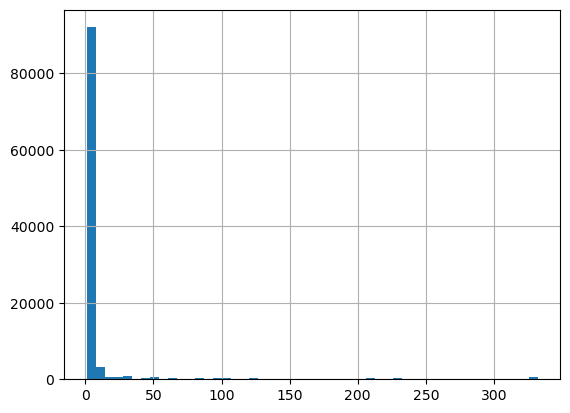

In [130]:
table.calculated_host_listings_count.hist(bins=50)

In [131]:
table.calculated_host_listings_count.median()
# calculate the mode of the values

1.0

In [132]:
table.calculated_host_listings_count.mode()
# calculate the median of the values

0    1.0
Name: calculated_host_listings_count, dtype: float64

In [133]:
table.calculated_host_listings_count.fillna(table.calculated_host_listings_count.median(), inplace=True)
# fill tha NaN values by median/mode value

In [134]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                      0
last_review                        15837
reviews_per_month                  15818
review_rate_number                     0
calculated_host_listings_count         0
availability_365                     448
house_rules     

In [135]:
table.availability_365.sort_values(ascending=True)

3106    -10.0
13309   -10.0
13899   -10.0
7277    -10.0
3302    -10.0
         ... 
87071     NaN
87072     NaN
87073     NaN
87099     NaN
87100     NaN
Name: availability_365, Length: 102058, dtype: float64

In [136]:
table.availability_365 = abs(table.availability_365)
# cannot be negative values of the column which contains the data of the number of the availiable days per year (logically the minimum value is 0). 
# So we change negative values to positive  

<AxesSubplot:>

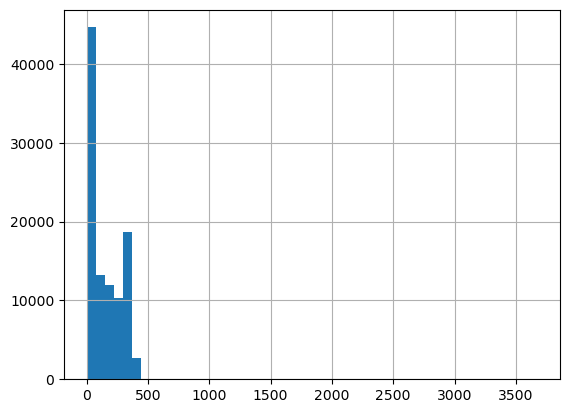

In [137]:
table.availability_365.hist(bins=50)

In [138]:
table.availability_365.value_counts()

0.0       23448
365.0      2484
364.0      1162
1.0         776
89.0        746
          ...  
375.0        32
412.0        32
401.0        30
391.0        30
3677.0        1
Name: availability_365, Length: 428, dtype: int64

In [139]:
table.availability_365.fillna(0.0,inplace=True)
# fill the Nan values by the most occured value

In [140]:
table.isna().sum()

id                                     0
name                                 250
host_id                                0
host_identity_verified                 0
host_name                            404
neighbourhood_group                    0
neighbourhood                          0
lat                                    0
long                                   0
country                              532
country_code                         131
instant_bookable                       0
cancellation_policy                    0
room_type                              0
construction_year                      0
price_usd                              0
service_fee                            0
minimum_nights                         0
number_of_reviews                      0
last_review                        15837
reviews_per_month                  15818
review_rate_number                     0
calculated_host_listings_count         0
availability_365                       0
house_rules     

In [141]:
table.drop(columns=['name', 'host_name', 'license', 'house_rules', 'country_code', 'country'], inplace=True) 
# drop the unnecessary columns for analyzing
# columns: license and house_rules have got a lot of missing values
# columns: country and country code because we are researching the dataset of Airbnb in New York
# columns: name and host name because they contains personal information which we can't restore

In [142]:
ProfileReport(table)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

1. High correlation (1.0) between price and service  - service fee is a part (20%) of price
2. High correlation between price/long and neighbourhood group
3. Negative correlation (from -0.1 to -0.5) between minimum nights and number of reviews / reviews per month - the correlation happens because of the fact that when people are going to rent a premise, they pay attention to the renting conditions (condition filter in search), namely, the minimun number of nights: the more the number of nights, the less the propability that the offer suits them at all.

<AxesSubplot:xlabel='host_identity_verified', ylabel='Count'>

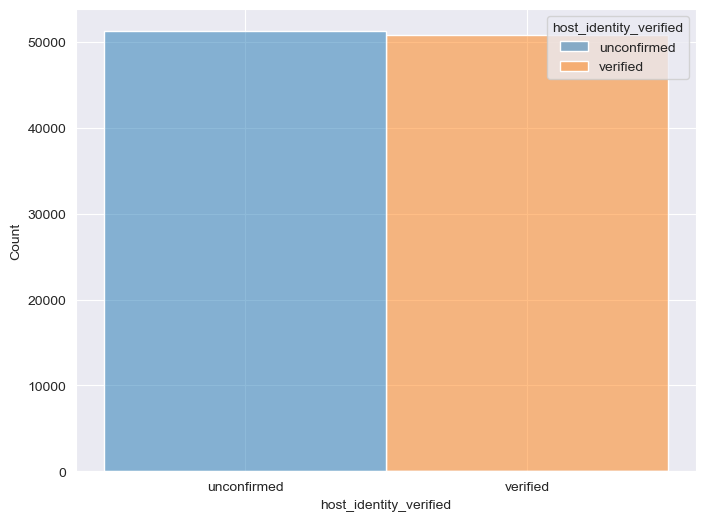

In [143]:
sns.set_style("darkgrid")
plt.figure(figsize=(8,6))
sns.histplot(x = table.host_identity_verified, hue=table.host_identity_verified)

<AxesSubplot:title={'center':'Number of offers in neighbourhood group for whole period'}, xlabel='neighbourhood_group', ylabel='Count'>

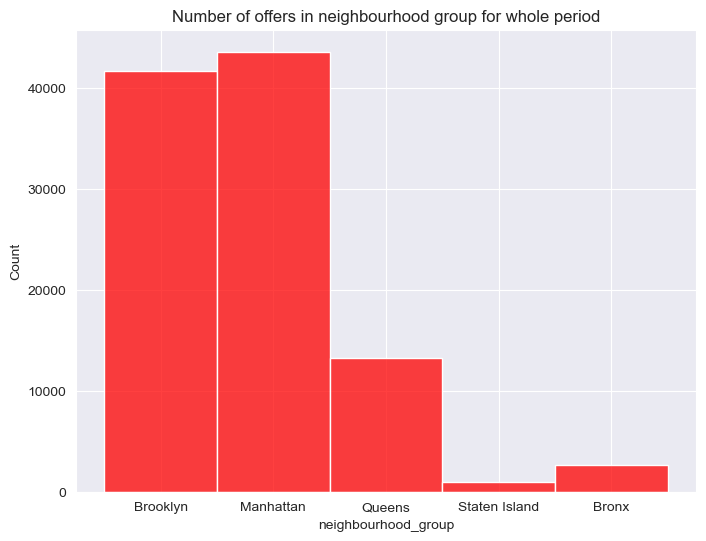

In [144]:
sns.set_style("darkgrid")
plt.figure(figsize=(8,6))
plt.title('Number of offers in neighbourhood group for whole period')
sns.histplot(x=table.neighbourhood_group, color='red')

<AxesSubplot:title={'center':'Number of offers in neighbourhood group for whole period'}, xlabel='neighbourhood_group', ylabel='Count'>

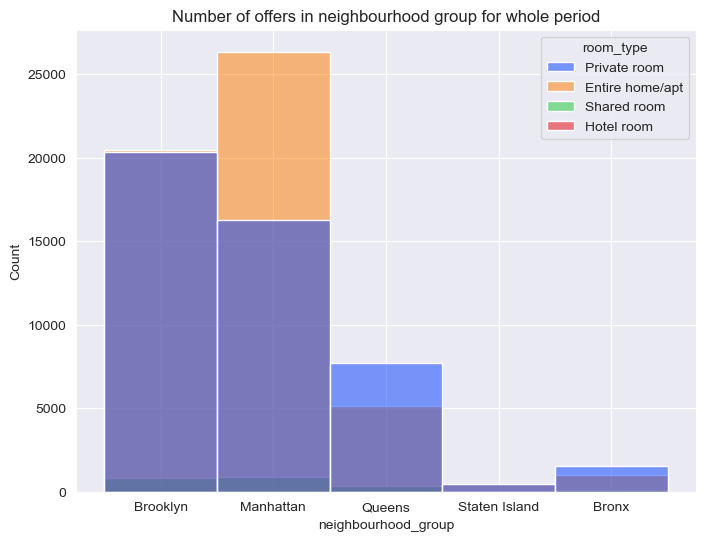

In [145]:
sns.set_style("darkgrid")
plt.figure(figsize=(8,6))
plt.title('Number of offers in neighbourhood group for whole period')
sns.histplot(x=table.neighbourhood_group,  hue=table.room_type , palette='bright')

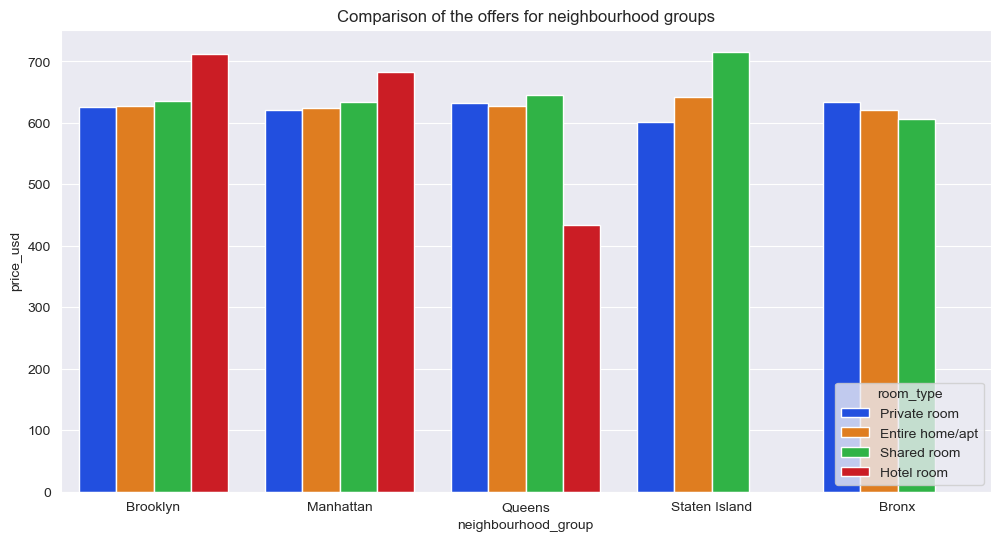

In [146]:

sns.set_style("darkgrid", {'legend.frameon':False})
plt.figure(figsize=(12,6))
plt.title('Comparison of the offers for neighbourhood groups')
sns.move_legend(sns.barplot(x=table.neighbourhood_group, y= table.price_usd, hue= table.room_type,estimator='mean', errorbar=None, palette='bright'), loc='lower right')

